# Product Recognition on Store Shelves
### Introduction:
Object detection techniques based on computer vision can be deployed in super market scenarios for the
creation of a system capable of recognizing products on store shelves. 
Given the image of a store shelf, such a system should be able identify the different products present 
therein and may be deployed, e.g. to help visually impaired costumers or to automate some common store
management tasks (e.g. detect low in stock or misplaced products).

### Overall Task:
Develop a computer vision system that, given a reference image for each product, is able to identify boxes 
of cereals of different brands from one picture of a store shelf. For each type of product displayed in the 
shelf the system should report:

1. Number of instances.
2. Dimension of each instance (width and height of the bounding box that enclose them in pixel).
3. Position in the image reference system of each instance (center of the bounding box that enclose 
them in pixel).

## Imported Libraries

In [1]:
# Imported Libraries
import numpy as np
import cv2
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
#plt.style.use('default')
from os import listdir
from plot_clusters import plot_clusters
import cmasher as cmr

# Images Path
scene_folder = './images/scenes/'
model_folder = './images/models/'

# RGB values setting for colors
RED = (255, 40, 30)
GREEN = (50, 255, 30)
BLUE = (10, 127, 255)

ORANGE = (255, 127, 20)
YELLOW = (255, 255, 0)

BLACK = (1, 1, 1)
WHITE = (255, 255, 255)
GRAY = (127, 127, 127)


##  Material Overview

### Model images

contains one reference image for each product that the system should be able to identify.

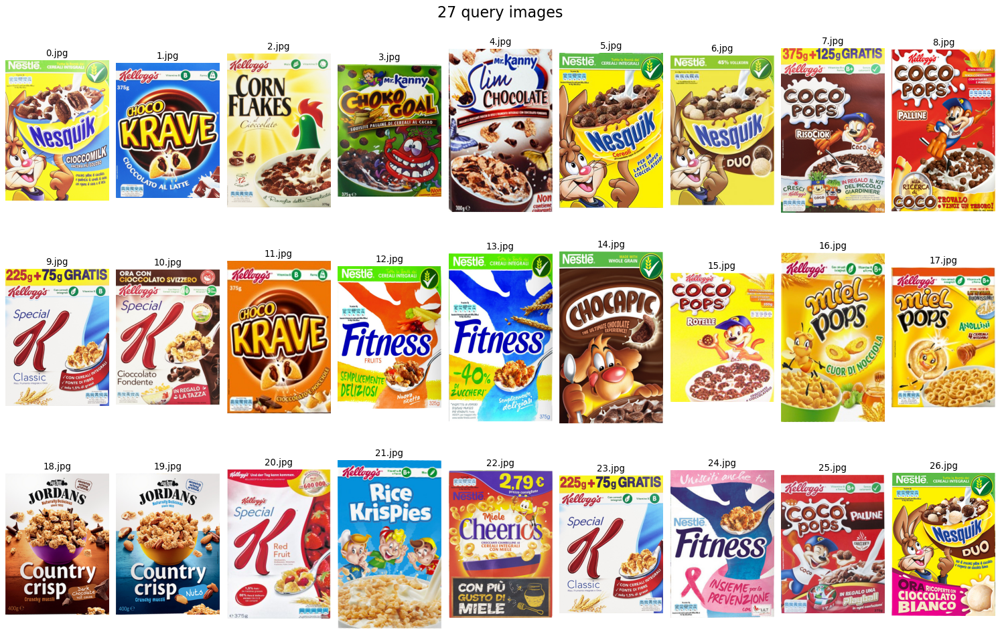

In [18]:
# Dictionary of models converted from BGR to RGB and sorted
models_props = [{'name': name, 'im': cv2.cvtColor(cv2.imread(model_folder + name), cv2.COLOR_BGR2RGB)} for name in listdir(model_folder)]
models_props.sort(key = lambda x: int(x['name'].split('.')[0]))

# List of models
model_images = [x['im'] for x in models_props]

# Setting of values for printing models
w, h, dpi = 1500, 1000, 80
fig, axs = plt.subplots(nrows = 3, ncols = 9, dpi = dpi, figsize = (w/dpi, h/dpi))

# Print the list of models
for image_data, ax in zip(models_props, axs.ravel()):
    ax.imshow(image_data['im'])
    ax.set_title(image_data['name'])
    ax.set_axis_off()
fig.suptitle(f'{len(models_props)} query images', fontsize = 20)
fig.tight_layout(pad = 1)
fig.savefig('./images/results/model_summary.png')
plt.show()

### Scene images

contains 15 different shelve picture to test the algorithm developed in different scenarios.

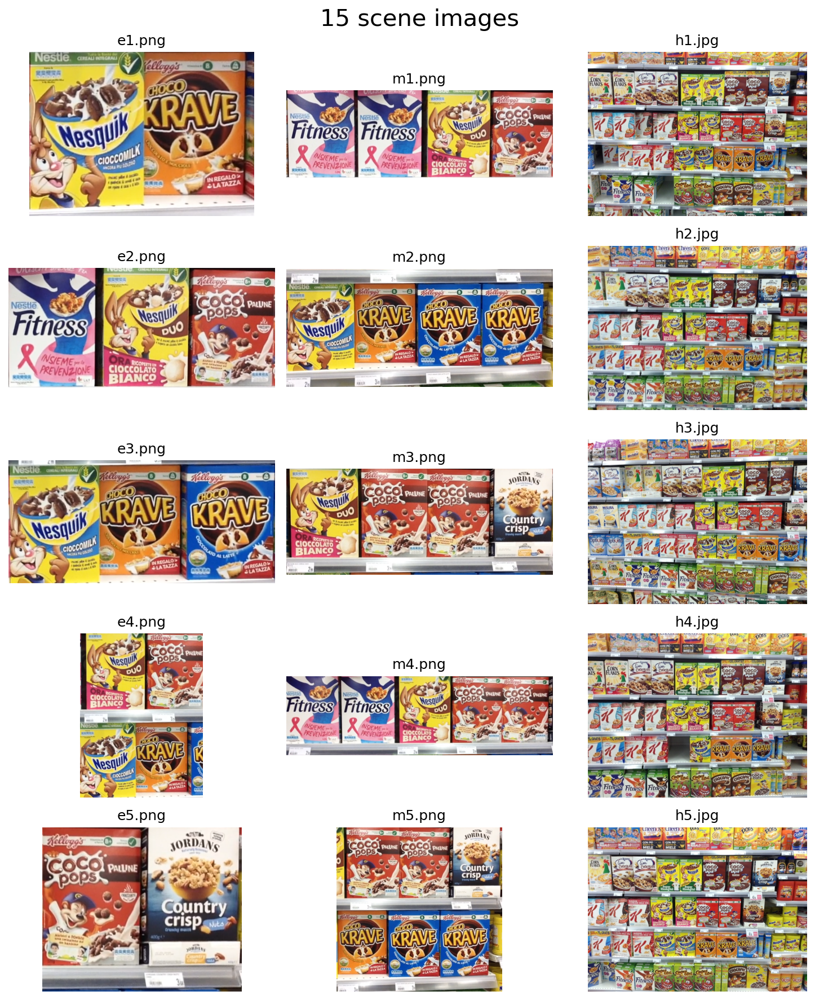

In [19]:
# Dictionary of scenes converted from BGR to RGB
scene_props = [{'name': name, 'im': cv2.cvtColor(cv2.imread(scene_folder + name), cv2.COLOR_BGR2RGB)} for name in listdir(scene_folder) if not 'h' in name]
scene_props += [{'name': name, 'im': cv2.cvtColor(cv2.imread(scene_folder + name), cv2.COLOR_BGR2RGB)} for name in listdir(scene_folder) if 'h' in name]

# List of scenes
scene_images = [x['im'] for x in scene_props]

# Setting of values for printing scenes
w, h, dpi = 1500, 1800, 150
fig, axs = plt.subplots(ncols = 3, nrows = 5, dpi = dpi, figsize = (w/dpi, h/dpi))

# Print the list of scenes
for image_data, ax in zip(scene_props, axs.T.ravel()):
    ax.imshow(image_data['im'])
    ax.set_title(image_data['name'])
    ax.set_axis_off()
fig.suptitle(f'{len(scene_props)} scene images', fontsize = 20)
fig.tight_layout(pad = 1)
fig.savefig('./images/results/scene_summary.png')
plt.show()

# Step A - Multiple Product Detection:

Develop an object detection system to identify single instance of products given: one reference image for 
each item and a scene image. The system should be able to correctly identify all the product in the shelves
image. One way to solve this task could be the use of local invariant feature as explained in lab session 5.

**It will have to be performed on the following materials:**

Test on scene image: {e1.png, e2.png, e3.png, e4.png, e5.png}

Use product images: {0.jpg, 1.jpg, 11.jpg, 19.jpg, 24.jpg, 26.jpg, 25.jpg}

### Read images

In [20]:
# Lists with the scenes and models of Step A
scene_filenames = [f'e{i+1}.png' for i in range(5)]
model_filenames = [f'{i}.jpg' for i in (0, 1, 11, 19, 24, 25, 26)]

#read images
im_scene_list = [cv2.cvtColor(cv2.imread(scene_folder + name), cv2.COLOR_BGR2RGB) for name in scene_filenames]
im_model_list = [cv2.cvtColor(cv2.imread(model_folder + name), cv2.COLOR_BGR2RGB) for name in model_filenames]

#resize model images
im_model_list = [cv2.resize(im, (480, 720)) for im in im_model_list]

### Define class for matching features

In [21]:
# Used to compute the matches between two images using local invariant features
class FeatureMatcher():
    
    # Attributes
    # Attributes ending with 1 refer to models while those ending with 2 refer to scenes
    _computed = False
    _kp1, _des1 = [], []
    _kp2, _des2 = [], []
    _matches = []
    _match_distance_threshold = 0.7
    _homography = np.zeros((3,3))
    _homography_mask = []
    
    # Constructor, initialize the sift, model and scene
    def __init__(self, im1, im2):
        self._sift = cv2.xfeatures2d.SIFT_create()
        self.im1 = im1
        self.im2 = im2

    # methods
    # Set methods

    def set_match_distance_threshold(self, threshold):
        self._match_distance_threshold = threshold
    
    # Sets keypoints and descriptors for image 1
    def set_descriptors_1(self, kp, des):
        self._kp1 = kp
        self._des1 = des

    # Sets keypoints and descriptors for image 2
    def set_descriptors_2(self, kp, des):
        self._kp2 = kp
        self._des2 = des
    
    def _reset_matches(self):
        '''
        Resets the internally stored data.
        '''
        self._matches = []
        self._computed = False

    # Get methods
    # The homography is computed from the matches using the RANSAC method.
    # Note: to get the homography from image 2 and image 1, invert the transformation matrix.
    def get_homography(self):
        # ndarray, 3x3 homography matrix between image 1 and image 2
        return self._homography, self._homography_mask
    
    def get_matches(self):
        # Matches: list of cv2.DMatch, the matches between image 1 and image 2
        return self._matches
    
    def get_keypoints(self):
        # list of cv2.KeyPoint, keypoints of image 1 and 2 respectively
        return self._kp1, self._kp2

    def get_descriptors(self):
        return self._des1, self._des2
    
    # Other methods
    def _find_descriptors_1(self):
        self._kp1, self._des1 = self._sift.compute(self.im1, self._sift.detect(self.im1))

    def _find_descriptors_2(self):
        self._kp2, self._des2 = self._sift.compute(self.im2, self._sift.detect(self.im2))

    # Computes matches between model and scene
    # force: recomputes the matches if the method "find_matches" has already been called. Default is False.
    def find_matches(self, force = False):
        
        if self._computed and not force:
            print('Matches already computed. To compute them again set force=True')
            return
        
        self._reset_matches()
        
        #The salient points for the two images and the scene images are stored internally.
        #If the salient points and their descriptors are not passed using ``set_descriptors_1`` and ``set_descriptors_2``, they are computed.
        if len(self._kp1) == 0:
            self._find_descriptors_1()

        if len(self._kp2) == 0:
            self._find_descriptors_2()
        
        # Defining index for approximate kdtree algorithm
        FLANN_INDEX_KDTREE = 1

        # Defining parameters for algorithm 
        flann = cv2.FlannBasedMatcher(
            {'algorithm': FLANN_INDEX_KDTREE,
             'trees': 5},
            {'checks': 50})
        
        #compute the best 2 matches for each salient point in the query image
        matches = flann.knnMatch(self._des1, self._des2, k=2)
        d = self._match_distance_threshold
        #if the distance between the best matches is less than d times the distance from the second best matches, keep the match
        #otherwise it is probably a false match that needs to be discarded
        self._matches = [m for m,n in matches if m.distance < d*n.distance]
        
        self._find_homography()
        self._computed = True
    
    def _find_homography(self):
        src_pts = np.float32([self._kp1[m.queryIdx].pt for m in self._matches])
        dst_pts = np.float32([self._kp2[m.trainIdx].pt for m in self._matches])
        
        M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
        
        self._homography = M
        self._homography_mask = mask.ravel().tolist()
    
    

### Test on a pair of images

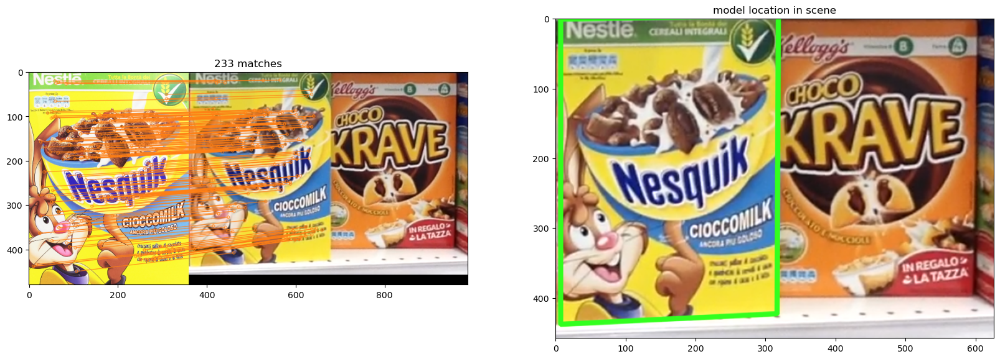

In [22]:
# Read and convert to RGB model and scene
im_scene = cv2.cvtColor(cv2.imread(scene_folder + 'e1.png'), cv2.COLOR_BGR2RGB)
im_model = cv2.cvtColor(cv2.imread(model_folder + '0.jpg'), cv2.COLOR_BGR2RGB)

im_model = cv2.resize(im_model, (360, 480))

# Instantiate the class with the two images and call the method find matches 
matcher = FeatureMatcher(im_model, im_scene)
matcher.find_matches()

matches = matcher.get_matches()
M, mask = matcher.get_homography()
kp_model, kp_scene = matcher.get_keypoints()

# Image that shows us all the matches
im1 = cv2.drawMatches(im_model, kp_model, im_scene, kp_scene, matches, None,
                       matchColor = ORANGE,
                       singlePointColor = None,
                       matchesMask = mask,
                       flags = 2)

h, w = im_model.shape[0], im_model.shape[1]
pts = np.float32([[0, 0], [0, h-1], [w-1, h-1], [w-1, 0]]).reshape(-1, 1, 2)

# Projecting the corners into the train image
dst = cv2.perspectiveTransform(pts, M)

# Drawing the bounding box
im2 = cv2.polylines(im_scene, [np.int32(dst)], True, GREEN, 5, cv2.LINE_AA)

w, h, dpi = 2000, 1500, 100
fig, axs = plt.subplots(ncols = 2, figsize = (w/dpi, h/dpi), dpi = dpi)

axs[0].imshow(im1)
axs[0].set_title(f"{len(matches)} matches")

axs[1].imshow(im2)
axs[1].set_title('model location in scene')

plt.show()


### Compute matches between each pair of scene and model image
This is done to find out what the optimal threshold for the number of matching points

In [23]:
# Find salient points of the images and corresponding descriptors
sift = cv2.xfeatures2d.SIFT_create()
kp_scene_list, des_scene_list = sift.compute(im_scene_list, sift.detect(im_scene_list))
kp_model_list, des_model_list = sift.compute(im_model_list, sift.detect(im_model_list))

### Create matrix with number of matches

In [24]:
# The matrix is instantiated
matcher_matrix = np.zeros((len(im_scene_list), len(im_model_list)), dtype = object)
matches_matrix = np.zeros(matcher_matrix.shape, dtype = int)

# The matrix is populated with matches
for i, (im_scene, kp_scene, des_scene) in enumerate(zip(im_scene_list, kp_scene_list, des_scene_list)):
    for j, (im_model, kp_model, des_model) in enumerate(zip(im_model_list, kp_model_list, des_model_list)):
        matcher = FeatureMatcher(im_model, im_scene)
        #set the previously computed descriptors and keypoints for performance reasons
        matcher.set_descriptors_1(kp_scene, des_scene)
        matcher.set_descriptors_2(kp_model, des_model)
        matcher.find_matches()
        matcher_matrix[i][j] = matcher
        matches_matrix[i][j] = len(matcher.get_matches())

### Display matches matrix

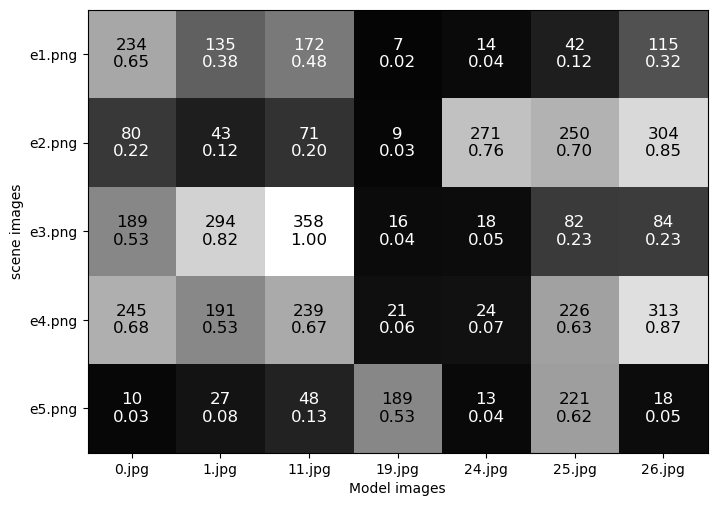

In [25]:
w, h, dpi = 800, 600, 100

fig, ax = plt.subplots(figsize = (w/dpi, h/dpi), dpi = dpi)
ax.imshow(matches_matrix, cmap = 'gray', vmin = 0)
ax.set_aspect('equal')

ax.set_xticks(range(len(model_filenames)), model_filenames)
ax.set_yticks(range(len(scene_filenames)), scene_filenames)

ax.set_xlabel('Model images')
ax.set_ylabel('scene images')

#annotate value
for i, line in enumerate(matches_matrix):
    for j, n in enumerate(line):
        if n < 0.5*np.max(matches_matrix):
            col = 'w'
        else:
            col = 'k'
        ax.text(j, i, f'{n}\n{n/np.max(matches_matrix):.2f}', ha="center", va="center", color=col, size = 12)

plt.show()

### Display image pairs with the most number of matches and boundig boxes

In [26]:
# The minimum number of matches is set
MIN_MATCH_NUMBER = 170

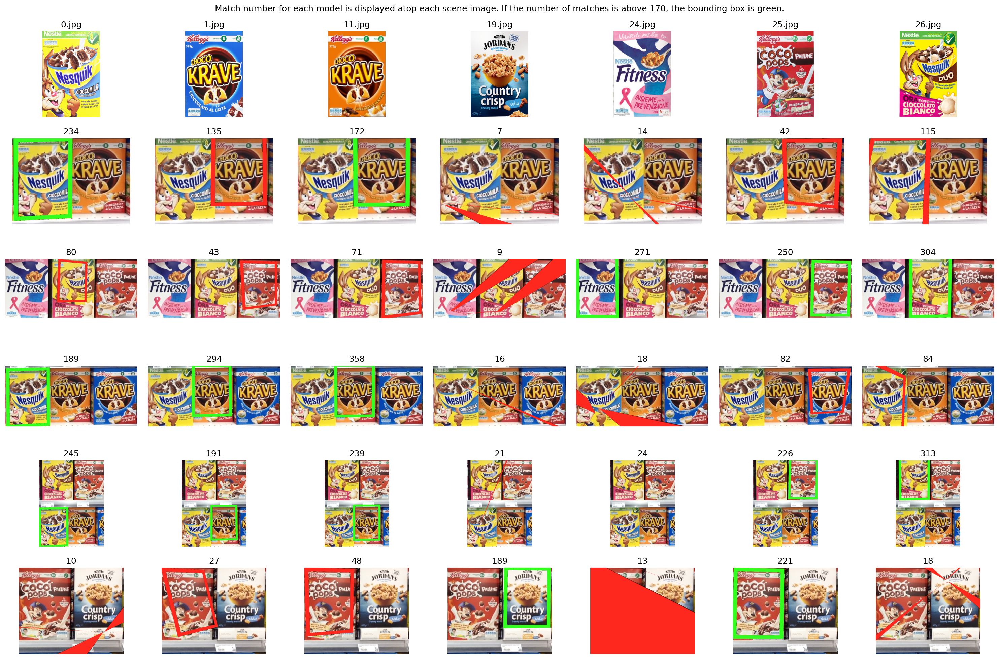

In [27]:
w, h, dpi = 3000, 2000, 150
fig, axs = plt.subplots(nrows = matcher_matrix.shape[0]+1, ncols = matcher_matrix.shape[1], figsize = (w/dpi, h/dpi), dpi = dpi)

for i, line in enumerate(matcher_matrix):
    im_scene = np.copy(im_scene_list[i])
    for j, matcher in enumerate(line):
        matches = matcher.get_matches()
        if len(matches) >= MIN_MATCH_NUMBER:
            color = GREEN
        else:
            color = RED
        
        im_model = np.copy(im_model_list[j])
        
        w, h = im_model.shape[0], im_model.shape[1]
        model_aspect = h/w
        imr = np.zeros(im_model.shape, dtype = np.uint8)
        imr = cv2.rectangle(imr, (0,0), (h,w), color, int(imr.shape[0]*0.1))
        
        M, _ = matcher.get_homography()
        
        w, h = im_scene.shape[0], im_scene.shape[1]
        scene_aspect = h/w
        imr = cv2.warpPerspective(imr, np.linalg.inv(M), (h,w))
        
        imr[imr==0] = im_scene[imr==0]
        
        axs[i+1,j].imshow(imr)
        axs[i+1,j].set_title(len(matches))

for i, ax in enumerate(axs[0, :]):
    ax.imshow(im_model_list[i])
    ax.set_title(model_filenames[i])

for ax in axs.ravel():
    ax.set_axis_off()

fig.suptitle(f'Match number for each model is displayed atop each scene image. If the number of matches is above {MIN_MATCH_NUMBER}, the bounding box is green.')
fig.tight_layout(pad = 1.5)
#fig.savefig('images/results/match_number.png')
plt.show()

# Step B - Multiple Instance Detection:

In addition to what achieved at step A, the system should now be able to detect multiple instance of the 
same product. Purposely, students may deploy local invariant feature together with the GHT (Generalized 
Hough Transform). More precisely, rather than relying on the usual R-Table, the object model acquired at 
training time should now consist in vectors joining all the features extracted in the model image to their
barycenter; then, at run time all the image features matched with respect to the model would cast votes 
for the position of the barycenter by scaling appropriately the associated joining vectors (i.e. by the ratio of 
sizes between the matching features).

**It will have to be performed on the following materials:**

Test on scene image: {m1.png, m2.png, m3.png, m4.png, m5.png}

Use product images: {0.jpg, 1.jpg, 11.jpg, 19.jpg, 24.jpg, 26.jpg, 25.jpg}

### Read images

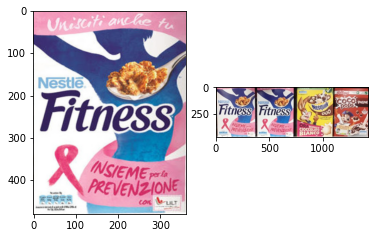

In [2]:
# Lists with the scenes and models of Step B
scene_filenames = [f'm{i+1}.png' for i in range(5)]
model_filenames = [f'{i}.jpg' for i in (0, 1, 11, 19, 24, 25, 26)]

# Read images
im_scene_list = [cv2.cvtColor(cv2.imread(scene_folder + name), cv2.COLOR_BGR2RGB) for name in scene_filenames]
im_model_list = [cv2.cvtColor(cv2.imread(model_folder + name), cv2.COLOR_BGR2RGB) for name in model_filenames]

im_scene = cv2.cvtColor(cv2.imread(scene_folder + 'm1.png'), cv2.COLOR_BGR2RGB)
im_model = cv2.cvtColor(cv2.imread(model_folder + '24.jpg'), cv2.COLOR_BGR2RGB)

im_model = cv2.resize(im_model, (360, 480))

fig, axs = plt.subplots(ncols = 2)

axs[0].imshow(im_model)
axs[1].imshow(im_scene)
plt.show()

## Generalized Hough transform

Display matches

Matches: 221


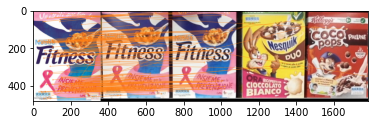

In [29]:
matcher = FeatureMatcher(im_model, im_scene)
matcher.set_match_distance_threshold(0.7)
matcher.find_matches()

kp_model, kp_scene = matcher.get_keypoints()
matches = matcher.get_matches()
print(f'Matches: {len(matches)}')

#display matching keypoints that match
im1 = cv2.drawMatches(im_model, kp_model, im_scene, kp_scene, matches, None,
                       matchColor = ORANGE,
                       singlePointColor = None,
                       #matchesMask = mask,
                       flags = 2)

plt.imshow(im1)
plt.show()

Calculate r-vectors

In [30]:
#filter keypoints that match (must do it after cv2.drawMatches)
kp_model = [kp_model[i] for i in [m.queryIdx for m in matches]]
kp_scene = [kp_scene[i] for i in [m.trainIdx for m in matches]]

#calculate r vectors for the model image
kp_model_pos = np.asarray([k.pt for k in kp_model])
kp_scene_pos = np.asarray([k.pt for k in kp_scene])

kp_model_angle = np.asarray([k.angle for k in kp_model])
kp_scene_angle = np.asarray([k.angle for k in kp_scene])
theta = kp_scene_angle - kp_model_angle

kp_model_size = np.asarray([k.size for k in kp_model])
kp_scene_size = np.asarray([k.size for k in kp_scene])
s = kp_scene_size/kp_model_size

barycenter_model = np.mean(kp_model_pos, axis = 0)

r_vectors = barycenter_model - kp_model_pos

Rotate and scale the r-vectors in the scene and cast the votes

In [31]:
#convert the relative rotation of the keypoints in array of rotation matrices
rotmats = np.array([[np.cos(theta), -np.sin(theta)],
                   [np.sin(theta), np.cos(theta)]])
rotmats = np.moveaxis(rotmats, (2,0,1), (0,1,2))

In [32]:
#rotate the r vectors according to their corresponding rotation matrix
r_vectors_rotated = rotmats@np.expand_dims(r_vectors, axis = -1)
r_vectors_rotated = r_vectors_rotated.squeeze()

#scale the rotated vectors according to their corresponding scale
r_vectors_scaled = np.multiply(r_vectors_rotated, np.expand_dims(s, axis = -1))

#vote the positions of the barycenter and 
vote_pos = kp_scene_pos + r_vectors_scaled
vote_pos = np.rint(vote_pos).astype(int)

#discard votes outside of the image frame
vote_inside_mask = (vote_pos[:,0] < im_scene.shape[1]) & (vote_pos[:,1] < im_scene.shape[0]) & (vote_pos[:,0] >= 0) & (vote_pos[:,1] >= 0)
vote_pos = vote_pos[vote_inside_mask]
kp_model_pos = kp_model_pos[vote_inside_mask]
kp_scene_pos = kp_scene_pos[vote_inside_mask]

Compute accumulator array

In [33]:
K = 15
n_bins = im_scene.shape[1]//K
m_bins = im_scene.shape[0]//K
acc_bin = np.zeros((n_bins, m_bins))

for pos in vote_pos:
    i,j = pos//K

    #discard votes outside of the image frame
    if i>=n_bins or j>=m_bins or i<0 or j<0: continue

    acc_bin[i,j]+=1

sigma = 4
k = np.ceil(3*sigma).astype(int)
acc_bin = cv2.GaussianBlur(acc_bin, (2*k+1,2*k+1), sigma)

#norm = np.linalg.norm(acc_bin)
acc_bin = acc_bin / np.max(acc_bin)

## Cluster the votes in the vote space

Find peaks in accumulator

In [34]:
x = acc_bin.flatten()

peaks, _ = find_peaks(x, height=0.3, prominence=0.5, distance = 0.2*acc_bin.shape[1]*acc_bin.shape[0])

centroids = np.unravel_index(peaks, acc_bin.shape)

Display peaks

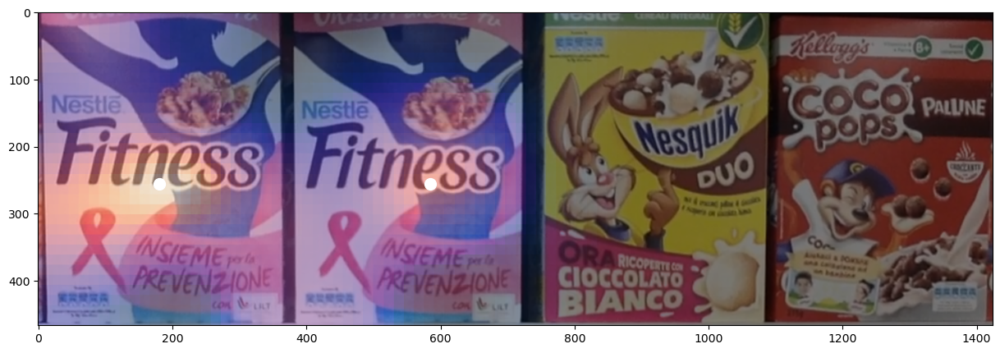

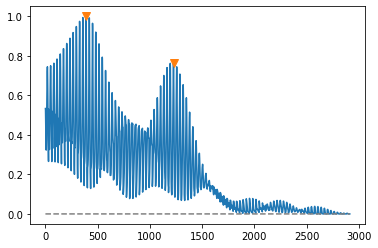

In [35]:
w, h, dpi = 1500, 1000, 100
fig, ax = plt.subplots(figsize = (w/dpi,h/dpi), dpi = dpi)

w, h = im_scene.shape[0], im_scene.shape[1]
acc_bin_resized = cv2.resize(acc_bin.astype(np.float32), (w, h), interpolation=cv2.INTER_NEAREST)
ax.imshow(acc_bin_resized.T, cmap=cmr.get_sub_cmap(cmr.torch, 0, 0.9))
ax.imshow(im_scene, alpha=0.5)
peaks_2d = np.vstack(np.unravel_index(peaks, acc_bin.shape))*K
peaks_2d = peaks_2d.T
ax.scatter(peaks_2d[:,0], peaks_2d[:,1], color = 'w', s = 100)
plt.show()

plt.plot(x)
plt.plot(peaks, x[peaks], "v", markersize = 8)

plt.plot(np.zeros_like(x), "--", color="gray")
plt.show()


Assign label to each keypoint

In [36]:
#initialize array of distances. First axis for the peak, second axis for the keypoint
#so the shape is (num_peaks, num_keypoints) 
distances = np.zeros(peaks.shape + (vote_pos.shape[0],))

for i, peak in enumerate(peaks_2d):
    distances[i] = np.linalg.norm(vote_pos - peak.T, axis = 1)

predicted_labels = np.argmin(distances, axis = 0)

Display labeled votes

Cluster 0 size: 95
Cluster 1 size: 75


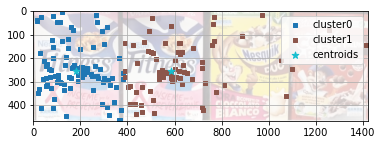

In [37]:
for label in np.unique(predicted_labels):
    print(f"Cluster {label} size: {len(vote_pos[predicted_labels==label])}")

plt.imshow(im_scene, alpha = 0.25)

plot_clusters(vote_pos, predicted_labels, dim=(0,1), points = peaks_2d)

Display bounding box

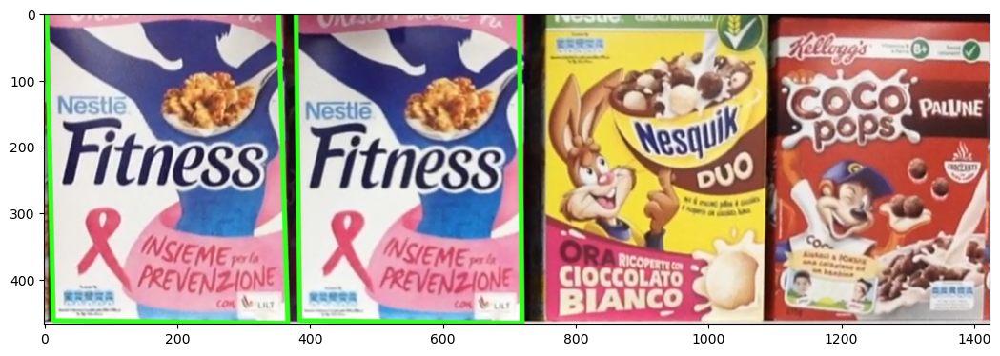

In [38]:
MIN_CLUSTER_THRESHOLD = 15

Homographies = []

for label in np.unique(predicted_labels):
    label_mask = predicted_labels==label
    votes = vote_pos[label_mask]
    if label==-1 or len(votes) < MIN_CLUSTER_THRESHOLD: continue

    kp_model_filtered = kp_model_pos[label_mask]
    kp_scene_filtered = kp_scene_pos[label_mask]

    M, mask = cv2.findHomography(kp_model_filtered, kp_scene_filtered, cv2.RANSAC, 1.)
    Homographies.append(M)

w, h, dpi = 1280, 720, 100
fig, ax = plt.subplots(figsize= (w/dpi, h/dpi), dpi=dpi)

im2 = np.copy(im_scene)

for M in Homographies:
    h, w = im_model.shape[0], im_model.shape[1]
    pts = np.float32([[0, 0], [0, h-1], [w-1, h-1], [w-1, 0]]).reshape(-1, 1, 2)

    # Projecting the corners into the train image
    dst = cv2.perspectiveTransform(pts, M)
    
    # Drawing the bounding box
    im2 = cv2.polylines(im2, [np.int32(dst)], True, GREEN, 5, cv2.LINE_AA)
#plot_clusters(vote_pos, predicted_labels, dim=(0,1), points = peaks_2d)
plt.imshow(im2)

plt.show()

In [4]:
from utils import MultipleInstanceMatcher

matcher = MultipleInstanceMatcher(im_model, im_scene)
matcher.find_matches()

## Using other clustering algorithms to label votes (to be removed)

In [39]:
from sklearn.cluster import KMeans, DBSCAN, OPTICS
from sklearn.mixture import GaussianMixture
from sklearn.neighbors import KernelDensity
from sklearn.metrics import silhouette_score
from plot_clusters import plot_clusters

clusters = range(2, 11)

silhouette = []

for n_clusters in clusters:
    estimator = GaussianMixture(n_components=n_clusters)
    #estimator = KMeans(n_clusters = n_clusters)
    labels = estimator.fit_predict(vote_pos)
    
    silhouette.append(silhouette_score(vote_pos, labels))

estimator = GaussianMixture(n_components=np.argmax(silhouette)+2)
#estimator = KMeans(n_clusters=np.argmax(silhouette)+2)
#estimator = KernelDensity(bandwidth=50)

predicted_labels = estimator.fit_predict(vote_pos)

Cluster 0 size: 15
Cluster 1 size: 80
Cluster 2 size: 75


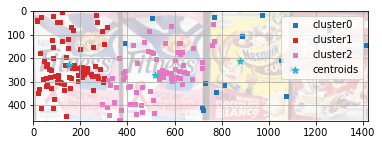

In [40]:
centroids = []
for label in np.unique(predicted_labels):
    if label == -1: continue
    centroids.append(np.mean(vote_pos[predicted_labels==label], axis = 0))
    print(f"Cluster {label} size: {len(vote_pos[predicted_labels==label])}")

centroids = np.vstack(centroids)
plt.imshow(im_scene, alpha = 0.25)

plot_clusters(vote_pos, predicted_labels, dim=(0,1), points = centroids)